# Data

> Über den [Link](https://sh333hdm.github.io/jupyterbooktest/intro.html) ist die Ansicht der Projektarbeit als Jupyter Book möglich. 

In [1]:
%matplotlib inline
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.stats import descriptivestats

sns.set_theme(palette="Pastel2", style="whitegrid") 

## Data ingestion

In [2]:
# Einlesen der Datei
# func.py: read_data
path = "data\project_data.csv"
df = pd.read_csv(path)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  object 
 3   total_rooms         20640 non-null  int64  
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  int64  
 6   households          20640 non-null  int64  
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  object 
 9   ocean_proximity     20640 non-null  object 
 10  price_category      20640 non-null  object 
dtypes: float64(4), int64(3), object(4)
memory usage: 1.7+ MB


Eine Änderung der Datentypen der Variablen *median_house_value*, *housing_median_age*, *ocean_proximity* und *price_category* ist notwendig. 

In [4]:
# func.py: transform_data
#median_house_value -> float
#housing_median_age -> float
#ocean_proximity -> category
#price_category -> category

df['ocean_proximity'] = df['ocean_proximity'].astype("category")
df['price_category'] = df['price_category'].astype("category")

df['median_house_value'] = pd.to_numeric(df['median_house_value'], errors='coerce')
df['housing_median_age'] = pd.to_numeric(df['housing_median_age'], errors='coerce')

Da Anomalien ausschließlich in der ersten Zeile vorkommen, werde diese schon bei der Umwandlung zum Datentyp "numeric" entfernt. Durch Setzen des Parameter `errors='coerce'` werden die ungültigen Werte mit NAN aufgefüllt. 

In [5]:
df[(df['median_house_value'] <150000) & (df['price_category'] != 'below')]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,price_category
23,-122.27,37.84,52.0,1688,337.0,853,325,2.1806,99700.0,NEAR BAY,above
26,-122.28,37.85,49.0,1130,244.0,607,239,2.4597,93800.0,NEAR BAY,above
35,-122.27,37.83,49.0,1215,282.0,570,264,1.4861,97200.0,NEAR BAY,above
51,-122.27,37.82,43.0,1868,456.0,1061,407,1.5045,93800.0,NEAR BAY,above
52,-122.27,37.82,41.0,3221,853.0,1959,720,1.1108,97500.0,NEAR BAY,above
...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665,374.0,845,330,1.5603,78100.0,INLAND,above
20636,-121.21,39.49,18.0,697,150.0,356,114,2.5568,77100.0,INLAND,above
20637,-121.22,39.43,17.0,2254,485.0,1007,433,1.7000,92300.0,INLAND,above
20638,-121.32,39.43,18.0,1860,409.0,741,349,1.8672,84700.0,INLAND,above


Die Variable  *price_category* ist nicht korrekt auf den *median_house_value* gemappt. Aus diesem Grund wird die Spalte *price_category* zur Korrektur angepasst. 

In [6]:
# func.py: transform_data
df['price_category'] = np.where(df['median_house_value'] > 150000, 'above', 'below')
df['price_category'] = df['price_category'].astype("category")

In [7]:
df[(df['median_house_value'] <150000) & (df['price_category'] != 'below')]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,price_category


## Data Spliting

Die vorliegenden Daten werden in Test- und Trainingsdaten aufgespaltet. 


In [8]:
# func.py: split_data
train_dataset = df.sample(frac=0.8, random_state=0)
test_dataset = df.drop(train_dataset.index)

## Clean Data

In [9]:
train_dataset.isnull().sum()

longitude               0
latitude                0
housing_median_age      1
total_rooms             0
total_bedrooms        160
population              0
households              0
median_income           0
median_house_value      1
ocean_proximity         0
price_category          0
dtype: int64

<AxesSubplot:>

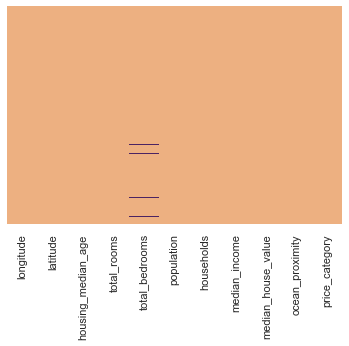

In [10]:
sns.heatmap(train_dataset.isnull(),yticklabels=False,cbar=False, cmap='flare')

NAN tritt insgesamt 162mal auf. Auf Grund der geringen Anzahl werden die Datensätze entfernt.  

In [11]:
#func.py: fill_missingdata
median_total_bedrooms = train_dataset["total_bedrooms"].median()
train_dataset.dropna(inplace=True)
train_dataset.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
price_category        0
dtype: int64

Für die Modell mit scikit-learn wird der `SimpleImputer` genutzt. Die numerischen NAN-Werte, werden dafür mit dem Median aufgefüllt. 

## Analyse Data

### Geographischer Daten- Mapping

Im ersten Schritt wird der *median_house_value* auf Kartendarstellung visualisert. 

In [12]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.express as px


fig = go.Figure(data=go.Scattergeo(
        locationmode = 'USA-states',
        lon = df['longitude'],
        lat = df['latitude'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'AgSunset',
            cmin = 0,
            color = df['median_house_value'],
            cmax = df['median_house_value'].max(),
            colorbar_title="Median house value"
        )))

fig.update_layout(
        title = 'Map Median House Value',
        geo_scope='usa',
    )
fig.show()

In [13]:

import plotly.express as px

fig = px.scatter_mapbox(train_dataset, lat="latitude", lon="longitude", size= "median_house_value",color="median_house_value",color_continuous_scale = 'Sunset',zoom=3, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Geographische Variablen - Scatterplot

Um die Beziehung der Variablen *Longitude/Latitude* zu *median_house_value* und *ocean_proximity* besser nachvollziehen zu können, werden diese Werte im zweiten Schritt als Streudiagramm analysiert. 

In [14]:
plt.rcParams['figure.figsize'] = [16, 16]

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

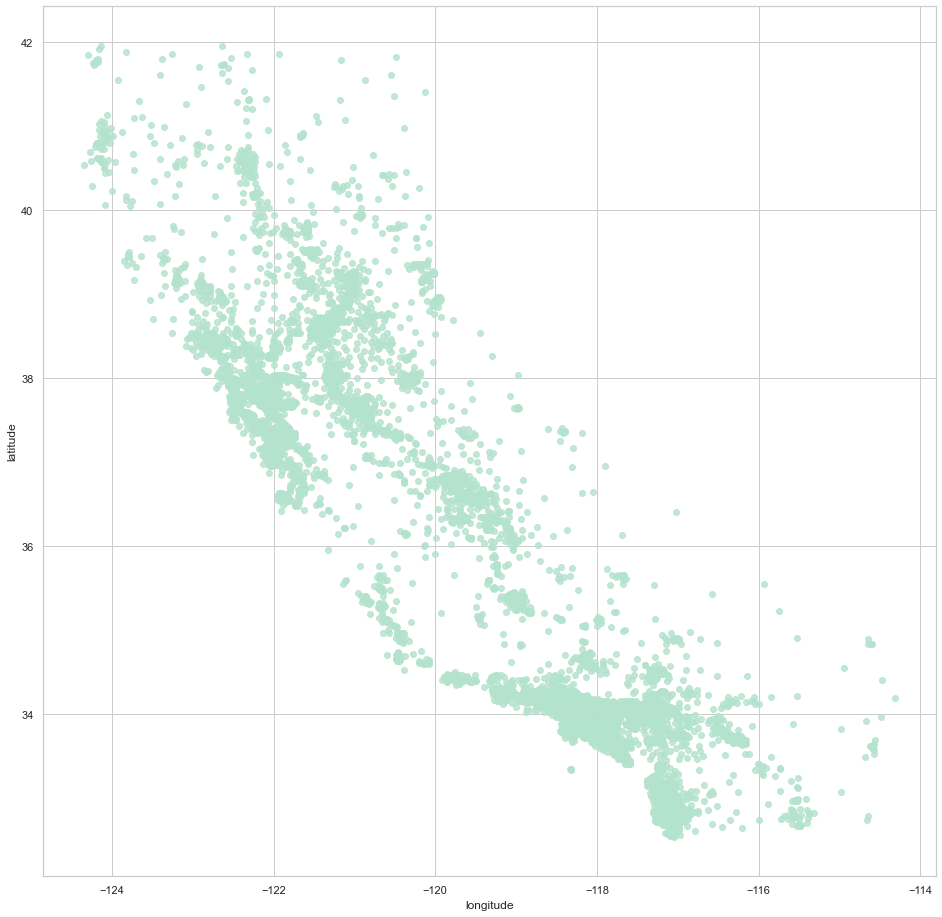

In [15]:
sns.regplot(data = train_dataset, x="longitude", y="latitude",  fit_reg=False)

Im Scatterplot ist der US-Bundesstaat Kalifornien mit den Ballungsgebieten San Francisco und Los Angeles abgebildet. 

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

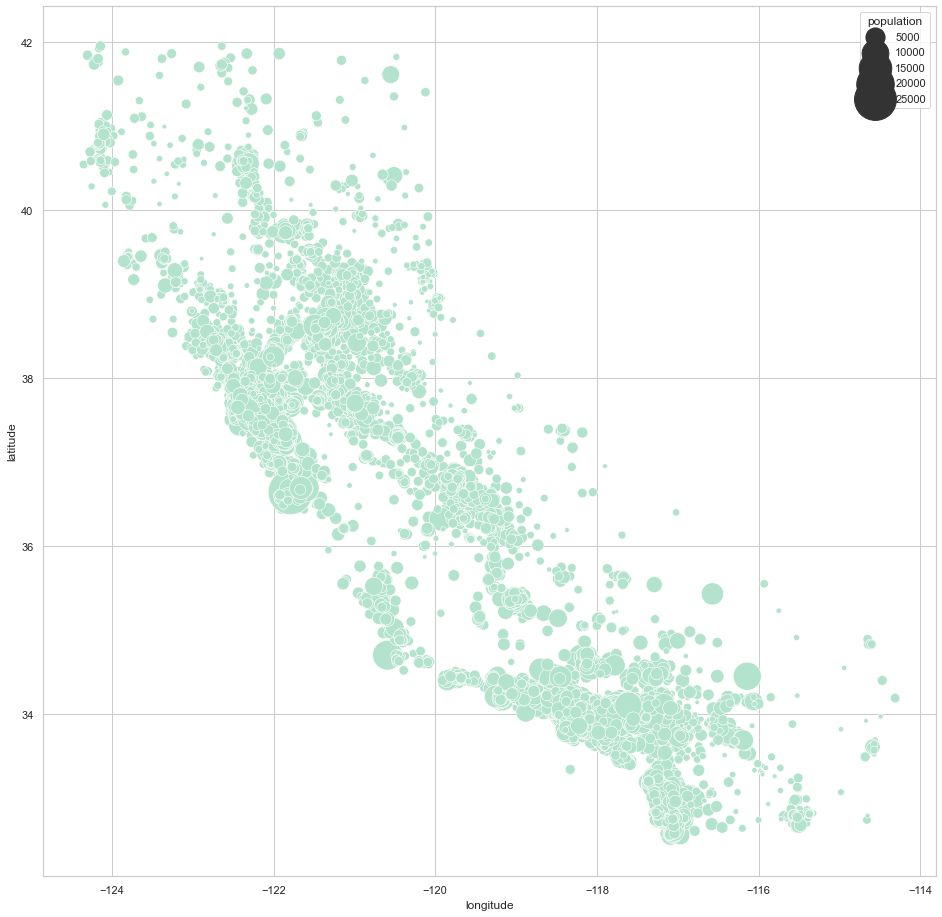

In [16]:
sns.scatterplot(data=train_dataset, x="longitude", y="latitude", size="population", legend=True, sizes=(20, 2000))

Die Größe der Population-Kreis bestätigt die Annahme, dass es sich um Ballungsgebiete handelt. 

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

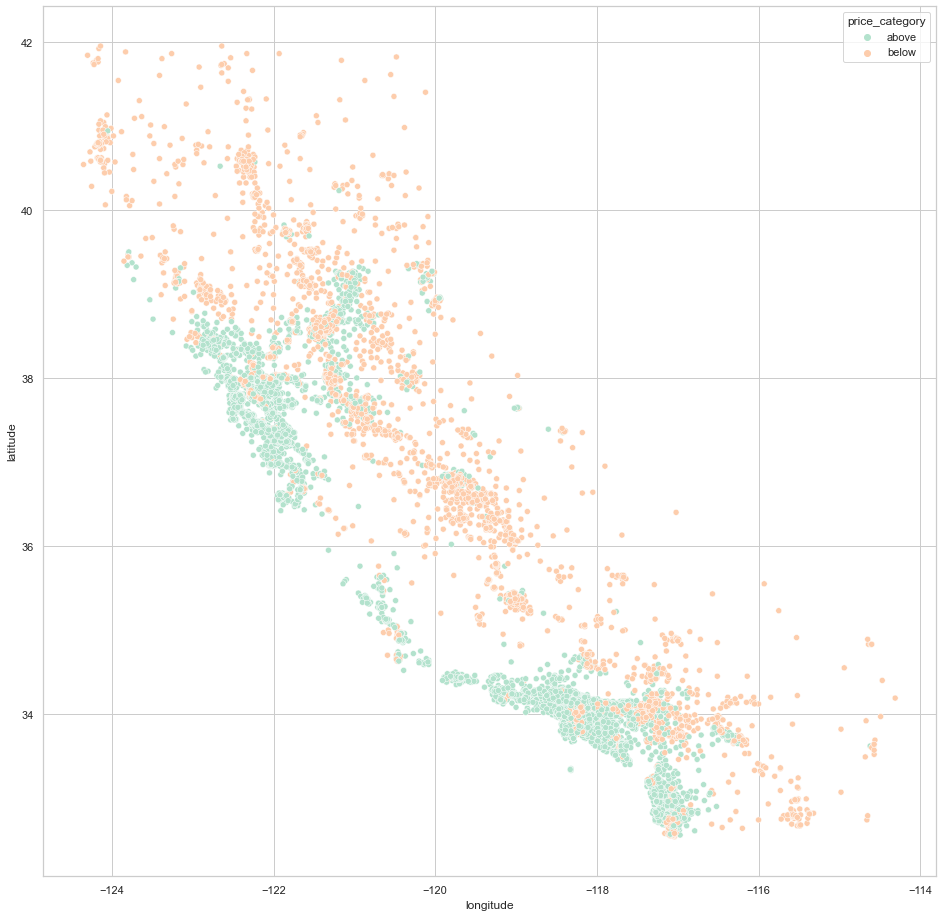

In [17]:

sns.scatterplot(data = train_dataset, x="longitude", y="latitude",  hue = "price_category")

Die Hervorhebung der Ausprägungen der kategorialen Variable *price_category* lässt vermuten, dass es eine Zusammenhang zwischen der Lage und *median_house_value*/*price_category* gibt. 

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

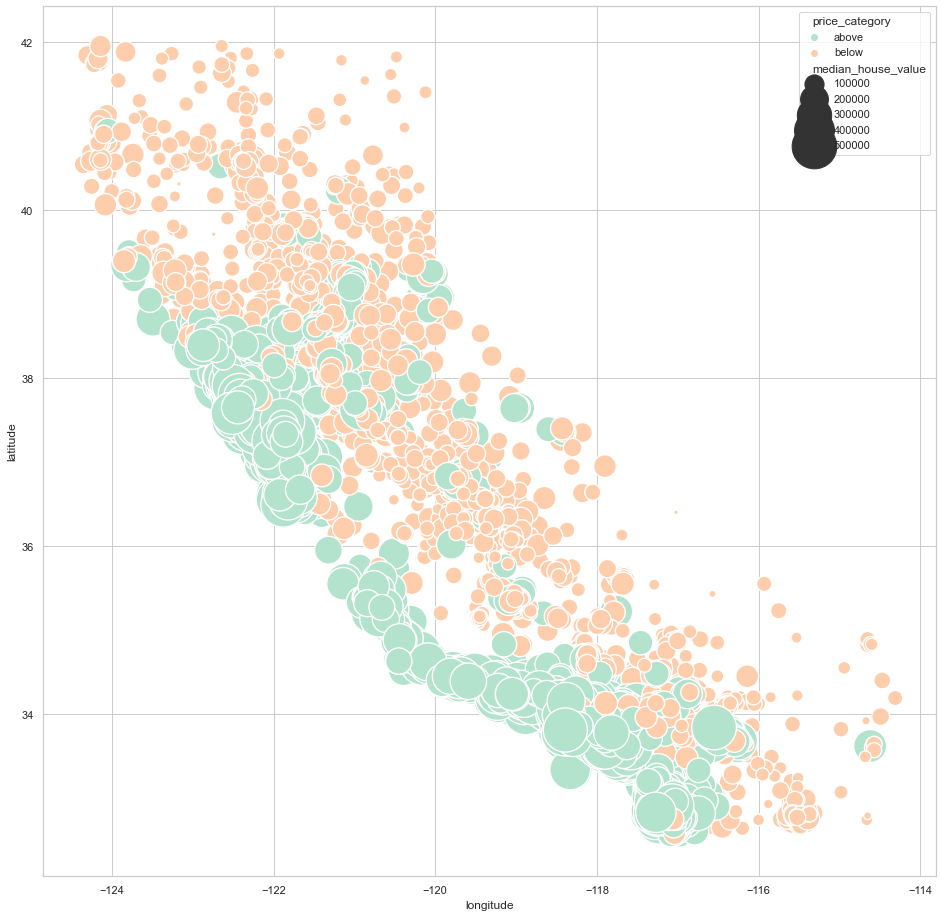

In [18]:
sns.scatterplot(data=train_dataset, x="longitude", y="latitude", size="median_house_value", hue="price_category", legend=True, sizes=(20, 2000))


<AxesSubplot:xlabel='longitude', ylabel='latitude'>

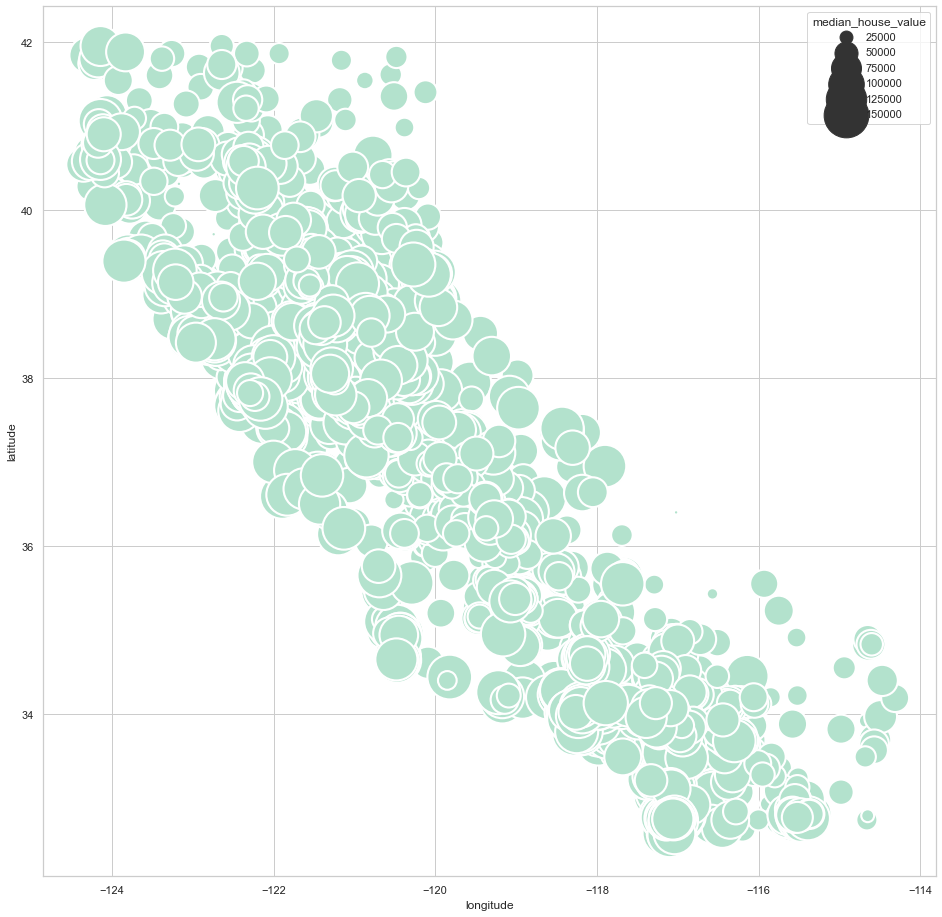

In [19]:
df_below = train_dataset[train_dataset['price_category'] == 'below']
sns.scatterplot(data=df_below, x="longitude", y="latitude", size="median_house_value", legend=True, sizes=(20, 2000))

* Die Distrikte mit einem *median_house_value* von unter 150 Tsd. sind über die gesamt Kalifornien verteilt.

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

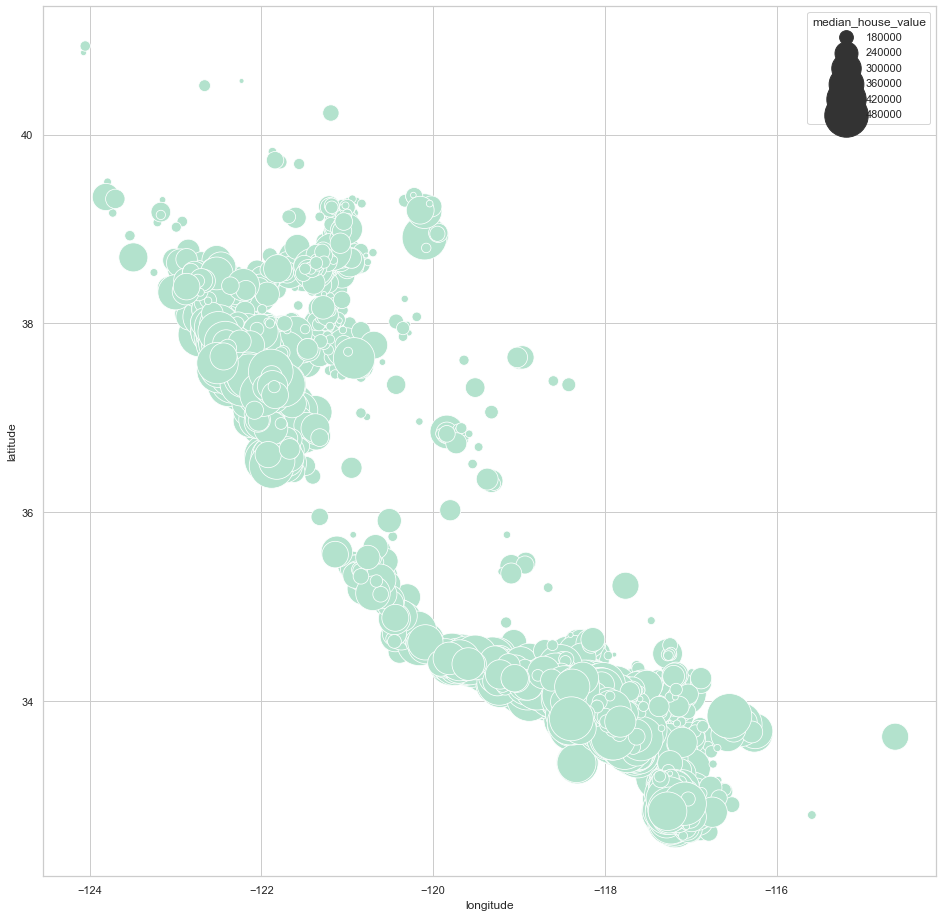

In [20]:
df_above = train_dataset[train_dataset['price_category'] == 'above']
sns.scatterplot(data=df_above, x="longitude", y="latitude", size="median_house_value", legend=True, sizes=(20, 2000))


* Die Distrikte  mit einem *median_house_value* von über 150 Tsd. scheinen sich auf bestimmte Flächen zu konzentrieren. 
* Aus diesem Grund kann es sinnvoll sein *longitude*/ *latitude* mit in der Erstellung der Modelle zu berücksichtigen. Beim Feauture Engineering sollte dafür ein geeigneter Weg gefunden werden. 

### Numerischen Variablen -Übersicht

In [21]:
train_dataset.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,16351.000000,16351.000000,16351.000000,16351.000000,16351.000000,16351.000000,16351.000000,16351.000000,16351.000000
mean,-119.561152,35.627474,28.624916,2625.422971,535.917008,1420.381934,497.484252,3.869469,206852.044034
std,1.997694,2.132312,12.581105,2151.964716,416.463980,1100.755736,377.235553,1.911662,115735.297652
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.775000,33.930000,18.000000,1450.000000,295.000000,787.000000,280.000000,2.556200,119400.000000
50%,-118.490000,34.260000,29.000000,2122.000000,434.000000,1163.000000,408.000000,3.528800,179400.000000
75%,-118.010000,37.710000,37.000000,3133.000000,644.000000,1724.000000,602.000000,4.744000,265000.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,28566.000000,6082.000000,15.000100,500001.000000


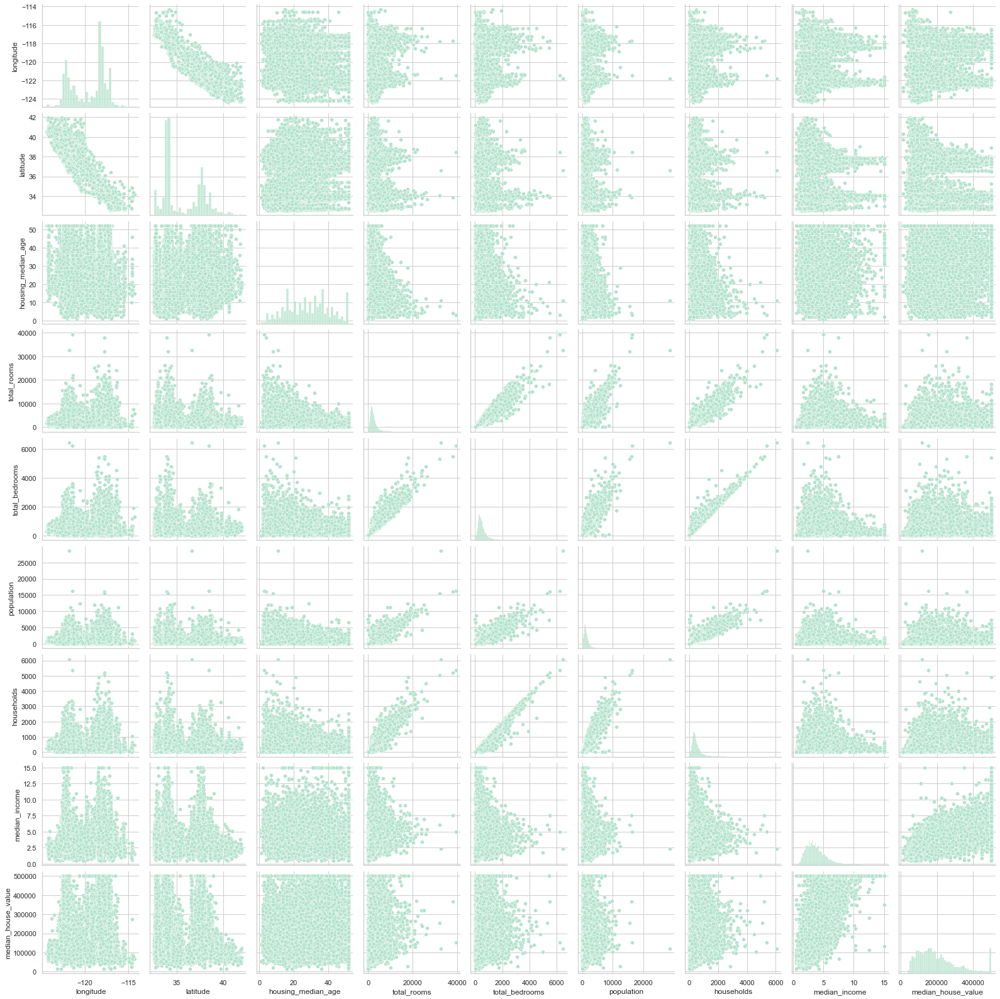

In [22]:
sns.pairplot(train_dataset)

Folgende erste Erkenntnisse können aus den `pairplot` geschlossen werden: 
* *median_house_value* hat die deutlichste Beziehung mit *median_income*. Die Beziehung ist positiv. 
* Zu den anderen numerischen Größen (in Bezug auf *median_house_value*) ist im `pairplot` kein eindeutiger Zusammenhang identifizierbar. 
* Die Variablen *households*, *population*, *total_bedrooms* und *total_rooms* scheinen untereinander in Beziehung (positiv)zu stehen. 

<AxesSubplot:xlabel='median_house_value', ylabel='Count'>

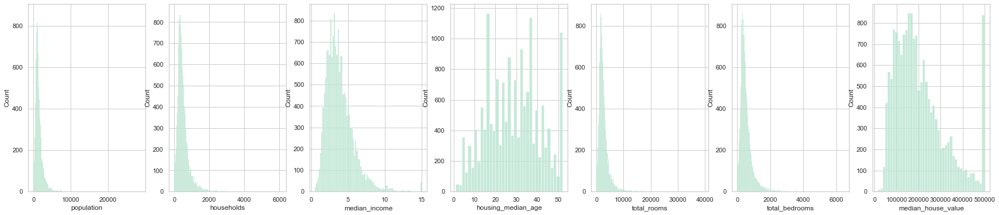

In [23]:
fig, axs = plt.subplots(1, 7, figsize=(30,6))
sns.histplot(data=train_dataset, x="population", ax=axs[0])
sns.histplot(data=train_dataset, x="households", ax=axs[1])
sns.histplot(data=train_dataset, x="median_income", ax=axs[2])
sns.histplot(data=train_dataset, x="housing_median_age", ax=axs[3])
sns.histplot(data=train_dataset, x="total_rooms", ax=axs[4])
sns.histplot(data=train_dataset, x="total_bedrooms", ax=axs[5])
sns.histplot(data=train_dataset, x="median_house_value", ax=axs[6])

Folgende Erkenntnisse lassen sich aus dem Diagrammen ableiten: 

* Die Verteilungen von *population, households, total_rooms, total_bedrooms, median_income, median_house_value* sind links schief. 
* Auffällig sind Ausschläge am Maximum-Punkt bestimmter Variablen: 
  * Peak bei *median_house_value* 50000 
  * Peak bei *house_median_age* 50 Jahre
  * Peak bei *median_income* bei 15,0 
  * Schlussfolgerung: Werte scheinen eine obere Grenze zu haben. Alle Distrikte oberhalb der jeweiligen Grenze scheinen zu einem Datenpunkt zusammengefasst sein. 
  * Für die Anwendung eines linearen Modells kann es sinnvoll sein diese Werte zu entfernen. 

In [24]:
#Mögliche Funktion
#id_income = train_dataset[train_dataset['median_income'] >= 15.0].index
#id_housing = train_dataset[train_dataset['housing_median_age'] >= 52.0].index
#train_dataset.drop(index=id_income, inplace =True)
#train_dataset.drop(index=id_housing, inplace =True)

### Numerische Variablen -Korrelation 

In [25]:
#Korellation untersuchen 
train_dataset_corr = train_dataset.drop(columns=['longitude', 'latitude'])
corr_matrix = train_dataset_corr.corr()
corr_matrix

,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
housing_median_age,1.000000,-0.357963,-0.314801,-0.293364,-0.295917,-0.116910,0.107851
total_rooms,-0.357963,1.000000,0.928971,0.858441,0.916585,0.197395,0.131556
total_bedrooms,-0.314801,0.928971,1.000000,0.879512,0.978452,-0.009969,0.048469
population,-0.293364,0.858441,0.879512,1.000000,0.910627,0.002822,-0.028441
households,-0.295917,0.916585,0.978452,0.910627,1.000000,0.010884,0.064225
median_income,-0.116910,0.197395,-0.009969,0.002822,0.010884,1.000000,0.686126
median_house_value,0.107851,0.131556,0.048469,-0.028441,0.064225,0.686126,1.000000


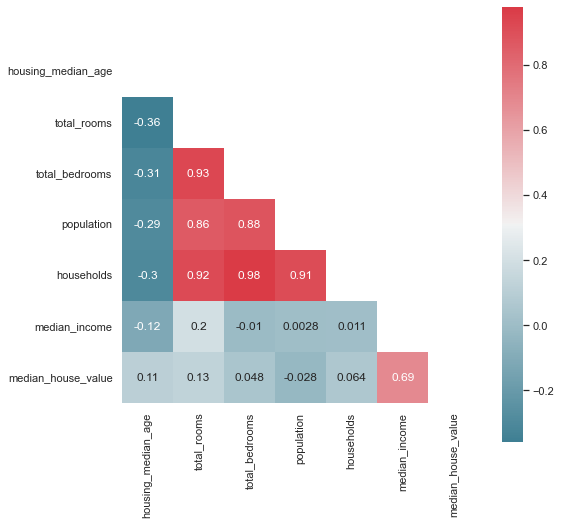

In [26]:
# Simple heatmap
plt.rcParams['figure.figsize'] = [8, 8]
cmap = sns.diverging_palette(220, 10, as_cmap=True)
mask = np.zeros_like(corr_matrix, dtype=bool)
mask[np.triu_indices_from(mask)] = True

heatmap = sns.heatmap(corr_matrix, mask = mask, square = True, cmap= cmap,  annot=True)

* Wie nach Auswertung des `pairplots` vermutet, bestätigt sich, dass *median_house_value* mit *median_income* am stärksten korreliert. 
* Die Korrelation zu den anderen Variablen ist gering. 
* Es besteht eine sehr hohe Korrelation zwischen *total_rooms, total_bedrooms*, *households* und *population*. Bei gemeinsamer Verwendung in einem Modell deutet dies auf Multikollinearität hin. 

### Numerische Variablen- Deskriptive Statistik

In [27]:
round(train_dataset.describe(),2).transpose()

,count,mean,std,min,25%,50%,75%,max
longitude,16351.0,-119.56,2.00,-124.35,-121.78,-118.49,-118.01,-114.31
latitude,16351.0,35.63,2.13,32.54,33.93,34.26,37.71,41.95
housing_median_age,16351.0,28.62,12.58,1.00,18.00,29.00,37.00,52.00
total_rooms,16351.0,2625.42,2151.96,2.00,1450.00,2122.00,3133.00,39320.00
total_bedrooms,16351.0,535.92,416.46,1.00,295.00,434.00,644.00,6445.00
population,16351.0,1420.38,1100.76,3.00,787.00,1163.00,1724.00,28566.00
households,16351.0,497.48,377.24,1.00,280.00,408.00,602.00,6082.00
median_income,16351.0,3.87,1.91,0.50,2.56,3.53,4.74,15.00
median_house_value,16351.0,206852.04,115735.30,14999.00,119400.00,179400.00,265000.00,500001.00


Die deskriptive Statistik der numerischen Variablen erfolgt auf Grundlage der Lagemaße Median (median), Mittelwert (mean) und Modus (mode), sowie der Streuungsmaße Standardabweichung (std), Spannweite (range) und Interquartilabstand. 

In [28]:
descriptivestats.describe(data = train_dataset[['median_house_value', 'median_income', 'housing_median_age', 'population', 'households']],stats = ["mean", "median", "mode", "std", "range", "min", "max", "percentiles","iqr"], categorical= False).transpose()

,mean,median,mode,mode_freq,std,range,min,max,iqr,1%,5%,10%,25%,50%,75%,90%,95%,99%
median_house_value,206852.044034,179400.0000,500001.0000,0.047459,115735.297652,485002.0000,14999.0000,500001.0000,145600.0000,50000.0000,65900.0000,82000.0000,119400.0000,179400.0000,265000.000,377300.0000,493650.0000,500001.00000
median_income,3.869469,3.5288,15.0001,0.002569,1.911662,14.5002,0.4999,15.0001,2.1878,1.0714,1.6003,1.8972,2.5562,3.5288,4.744,6.1724,7.3341,10.60835
housing_median_age,28.624916,29.0000,52.0000,0.061281,12.581105,51.0000,1.0000,52.0000,19.0000,4.0000,8.0000,12.0000,18.0000,29.0000,37.000,46.0000,52.0000,52.00000
population,1420.381934,1163.0000,891.0000,0.001468,1100.755736,28563.0000,3.0000,28566.0000,937.0000,83.0000,347.0000,513.0000,787.0000,1163.0000,1724.000,2564.0000,3288.5000,5752.00000
households,497.484252,408.0000,306.0000,0.002936,377.235553,6081.0000,1.0000,6082.0000,322.0000,27.5000,125.0000,185.0000,280.0000,408.0000,602.000,884.0000,1151.0000,1954.00000


* Die obere Grenze der Werte *housing_median_age, median_income* und *median_house_value* wird auch in der deskriptiven Statistik deutlich in dem der Modus gleichhoch ist wie der maximal Wert. 
* Die weiteren ermittelten Größen werden in die EDA einbezogen. 

### Numerische Variabeln- EDA

**EDA Median Income**

<AxesSubplot:xlabel='median_house_value', ylabel='median_income'>

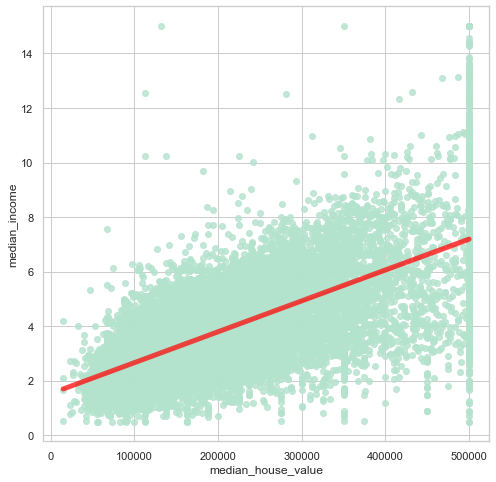

In [29]:
sns.regplot(x=train_dataset["median_house_value"], y=train_dataset["median_income"], line_kws={"color":"r","alpha":0.7,"lw":5})

* Die positive Beziehung wird durch das Streuungsdiagramm visuell verdeutlicht. 


<AxesSubplot:ylabel='median_income'>

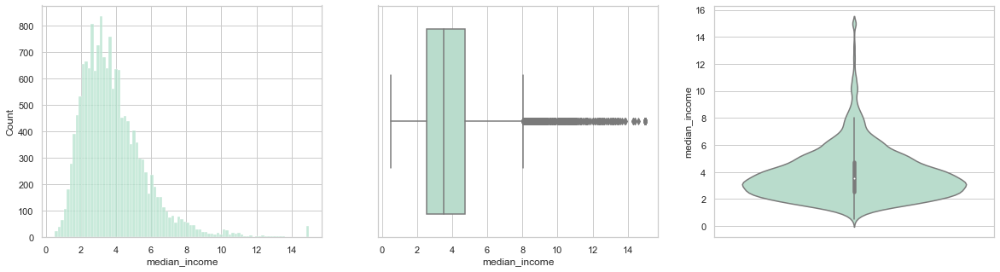

In [30]:
fig, axs = plt.subplots(1, 3, figsize=(20,5))
sns.histplot(data=train_dataset, x="median_income", ax=axs[0])
sns.boxplot(data=train_dataset, x="median_income",ax=axs[1])
sns.violinplot(y=train_dataset["median_income"],ax=axs[2])

* Im Boxplot wird deutlich, dass die Interquartilrange im Vergleich zur Spannweite gering ist. 
* Da im Boxplot Ausreißer als oberhalb der Grenze von 1,5 des Interquartilsabstands definiert  werden, ist eine Vielzahl an Ausreißer zu erkennen. 
* Aus diesem Grund wurde noch ein Violin-Plot zur Darstellung gewählt. 

<AxesSubplot:xlabel='median_income', ylabel='Density'>

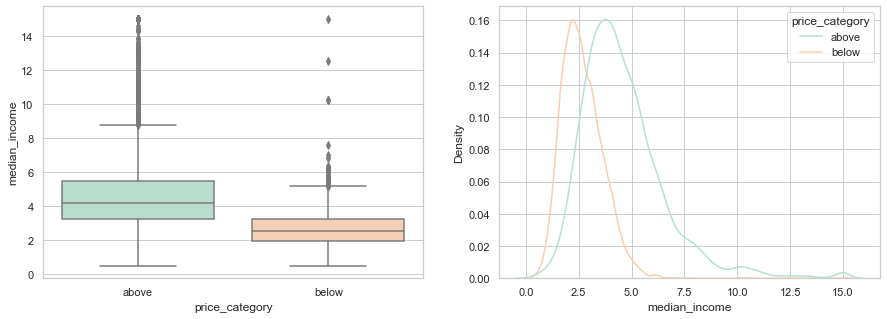

In [31]:
fig, axs = plt.subplots(1, 2, figsize=(15,5))
sns.boxplot( x=train_dataset["price_category"], y=train_dataset["median_income"], ax=axs[0])
sns.kdeplot(data=train_dataset, x="median_income", hue="price_category",ax=axs[1])

* Sowohl in der Boxplot- wie auch in der Densitiy-Darstellung wird unterschiedliche Verteilung des *median_incomes* deutlich. 
* Der Median liegt bei above-Distrikten bei einem mittleren Einkommen von 45 Tsd USD und bei below-Distrikten bei 26 Tsd USD. 

> Das Feature *median_income* sollte in den statistischen Modell (Klassifikation und Regression) mit berücksichtigt werden.

**EDA housing_age**

<AxesSubplot:xlabel='median_house_value', ylabel='housing_median_age'>

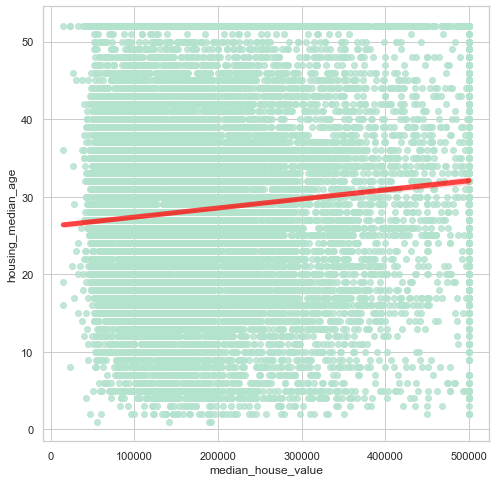

In [32]:
sns.regplot(x=train_dataset["median_house_value"], y=train_dataset["housing_median_age"], line_kws={"color":"r","alpha":0.7,"lw":5})

* Im Streudiagramm ist kein deutliche Beziehung zwischen *housing_median_age* und *median_house_value* erkennbar. 
* Vielmehr scheint das mittlere Immobilienalter über die Gesamte Fläche zu streuen. 


C:\Users\sophi\anaconda3\lib\site-packages\seaborn\distributions.py:1699: FutureWarning:

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.25 for `bw_method`, but please see the docs for the new parameters and update your code.



<AxesSubplot:ylabel='housing_median_age'>

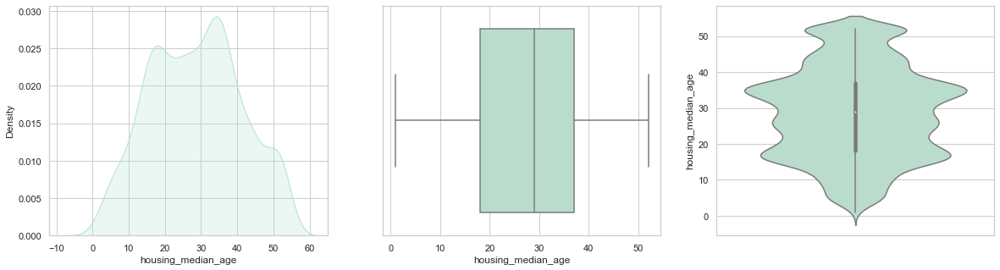

In [33]:
fig, axs = plt.subplots(1, 3, figsize=(20,5))
sns.kdeplot(data=train_dataset, x="housing_median_age", shade=True, bw=0.25, ax=axs[0])
sns.boxplot(data=train_dataset, x="housing_median_age",ax=axs[1])
sns.violinplot(y=train_dataset["housing_median_age"],ax=axs[2])

Um weitere Visualisierung der Beziehung zwischen housing_median_age und median_house_value darzustellen, wird aus Erstem eine kategoriale Variable erstellt. 

In [34]:
train_dataset['housingage_cat'] = '00'
train_dataset['housingage_cat'][train_dataset['housing_median_age'] <18] = '25'
train_dataset['housingage_cat'][(train_dataset['housing_median_age'] >=18) & (train_dataset['housing_median_age'] <=29)] = '50'
train_dataset['housingage_cat'][(train_dataset['housing_median_age'] >29) & (train_dataset['housing_median_age'] <=37)] = '75'
train_dataset['housingage_cat'][(train_dataset['housing_median_age'] >37)] = '100'

C:\Users\sophi\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\sophi\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\sophi\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\sophi\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A v

In [35]:
train_dataset

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,price_category,housingage_cat
14740,-117.05,32.58,22.0,2101,399.0,1551,371,4.1518,136900.0,NEAR OCEAN,below,50
10101,-117.97,33.92,32.0,2620,398.0,1296,429,5.7796,241300.0,<1H OCEAN,above,75
20566,-121.84,38.65,29.0,3167,548.0,1554,534,4.3487,200700.0,INLAND,above,50
2670,-115.60,33.20,37.0,709,187.0,390,142,2.4511,72500.0,INLAND,below,75
15709,-122.43,37.79,25.0,1637,394.0,649,379,5.0049,460000.0,NEAR BAY,above,50
...,...,...,...,...,...,...,...,...,...,...,...,...
7616,-118.22,33.86,16.0,8732,1489.0,3944,1493,5.1948,203500.0,<1H OCEAN,above,25
8767,-118.39,33.81,35.0,1008,165.0,391,167,3.7778,487500.0,NEAR OCEAN,above,75
16388,-121.30,38.05,52.0,122,26.0,62,25,1.1500,112500.0,INLAND,below,100
19949,-119.37,36.21,35.0,2228,476.0,1567,449,1.4455,54100.0,INLAND,below,75


<AxesSubplot:xlabel='housingage_cat', ylabel='median_house_value'>

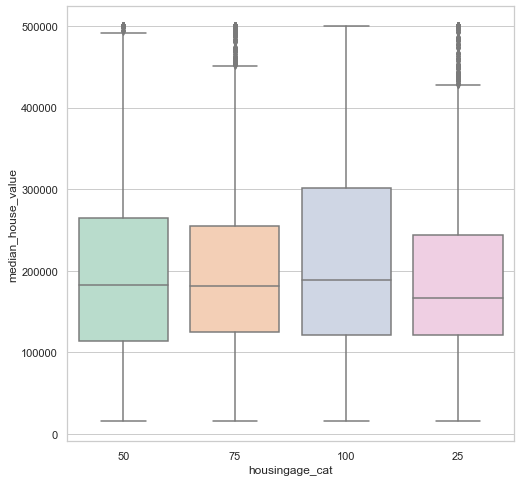

In [36]:
sns.boxplot( x=train_dataset["housingage_cat"], y=train_dataset["median_house_value"])

In [37]:
train_dataset.drop(columns= 'housingage_cat', inplace = True)

Auch in dieser Darstellung ist kein eindeutige Beziehung erkennbar und die generierte Variable wird wieder entfernt. 

<AxesSubplot:xlabel='housing_median_age', ylabel='Density'>

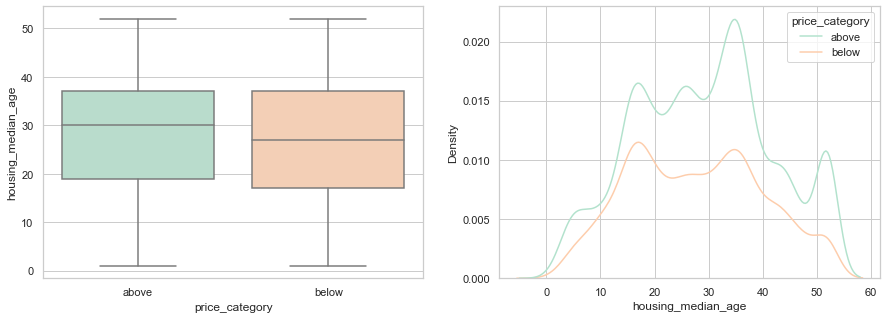

In [38]:
fig, axs = plt.subplots(1, 2, figsize=(15,5))
sns.boxplot( x=train_dataset["price_category"], y=train_dataset["housing_median_age"], ax=axs[0])
sns.kdeplot(data=train_dataset, x="housing_median_age", hue="price_category",ax=axs[1])

Auch bei Betrachtung der Beziehung zwischen *price_category* und *housing_median_age*, ist kein eindeutiger Zusammenhang erkennbar. 

> Bei *housing_median_age* ist keine eindeutige Beziehung zu *median_house_value* oder *price_category* erkennbar.
> Der positive Effekt auf das Modell wird als gering eingeschätzt. 

### Kategoriale Variablen- Deskriptive Statistik

In [39]:
from statsmodels.stats import descriptivestats
descriptivestats.describe(data = train_dataset, categorical= True).ocean_proximity.dropna()

nobs             16351
missing              0
distinct             5
top_1        <1H OCEAN
top_2           INLAND
top_3       NEAR OCEAN
top_4         NEAR BAY
top_5           ISLAND
freq_1        0.441869
freq_2        0.319736
freq_3        0.128861
freq_4         0.10929
freq_5        0.000245
Name: ocean_proximity, dtype: object

In [40]:
train_dataset.ocean_proximity[train_dataset['ocean_proximity'] == 'ISLAND'].count()

4

Die kategoriale Variable *ocean_proximity* hat 5 Ausprägung: "<1H OCEAN", "INLAND", "NEAR BAY", "NEAR OCEAN" und "ISLAND". 

Durch die Analyse der Verteilung wird deutlich, dass die Ausprägungen <1H OCEAN (44%)und Inland (32%) am häufigsten vorkommen. Distrikte "NEAR BAY" und "NEAR OCEAN" kommen seltenere vor. Sehr selten sind Distrikte auf einer Insel. In dem Trainingsdatensatz sind es nur 4 Distrikte.

### Kategoriale Variable- EDA

Im folgenden wird die Variable "ocean_proximity" detailiert betrachtet. 

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

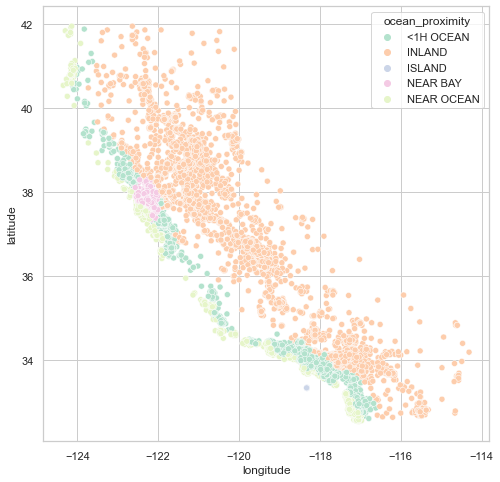

In [41]:
sns.scatterplot(data = train_dataset, x="longitude", y="latitude",  hue = "ocean_proximity")

Zum Nachvollziehen der kategorialen Variable *ocean_proximity* ist diese im Scatterplot durch `hue` dargestellt. 

<AxesSubplot:xlabel='ocean_proximity', ylabel='Count'>

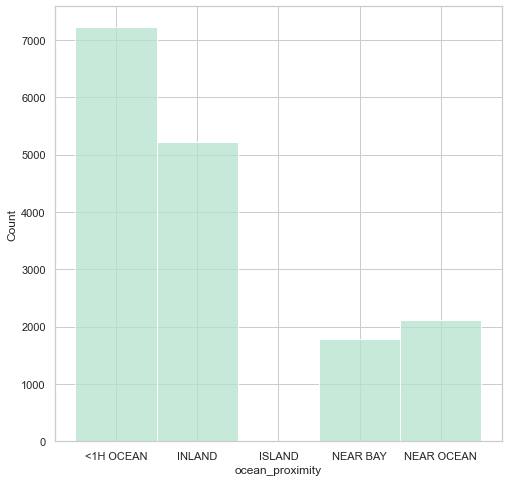

In [42]:
sns.histplot(data=train_dataset, x="ocean_proximity")

* Die meisten Distrikte liegen weniger als eine Stunde vom Ozean weg.
* Sehr wenige Distrikte befinden sich auf Insel.


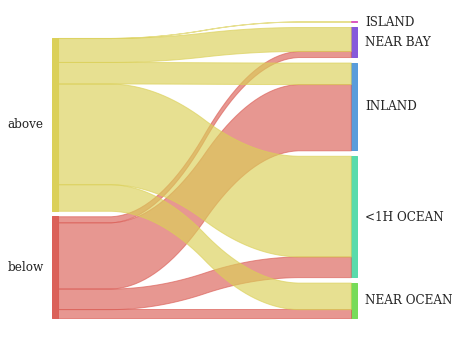

In [43]:
from pySankey.sankey import sankey
sankey(train_dataset["price_category"], train_dataset["ocean_proximity"], aspect=20, fontsize=12)

* Die meisten Distrikte, die zur Preiskategegorie "below" gehören, liegen im Inland. 
* Die meisten Distrikte, die zur Preiskategorie "above" gehören, liegen weniger als eine Stunde vom Ozean entfernt. 
* Dementsprechend kann es sinnvoll sein, die kategoriale Variable *ocean_proximity* bei der Klassifikation mit einzubeziehen. 

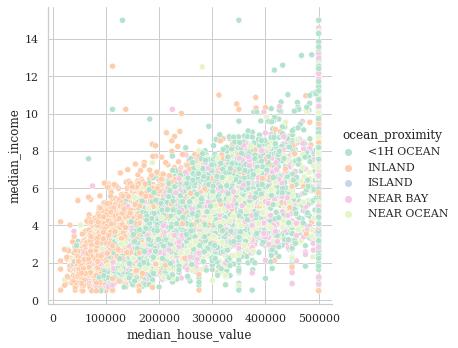

In [44]:
sns.relplot(data = train_dataset, 
            x = "median_house_value",
            y= "median_income", 
            hue = "ocean_proximity")

<AxesSubplot:xlabel='median_house_value', ylabel='Count'>

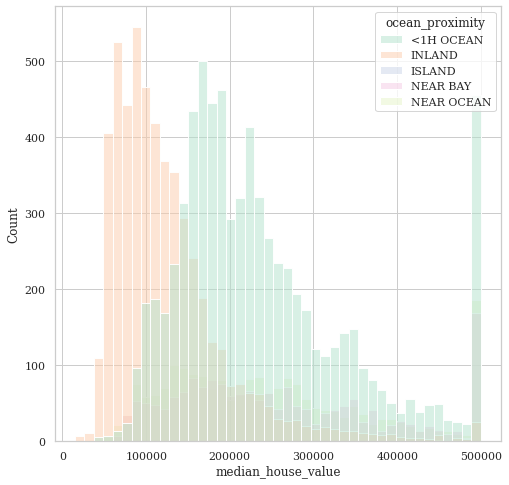

In [45]:
sns.histplot(data = train_dataset, x="median_house_value", hue="ocean_proximity")


* Das Histogramm bestätigt, dass die Nähe zum Ozean Einfluss auf *median_house_value*"* hat. 
* Für Distrikten im Inland ist die Verteilung im Vergleich zum Beispiel zu "<1h Ocean" linksverschoben. 
* Da die Variable *ocean_proximity* 5 Ausprägungen hat, ist es sinnvoll sich die Verteilung in separaten Plots anzuschauen.

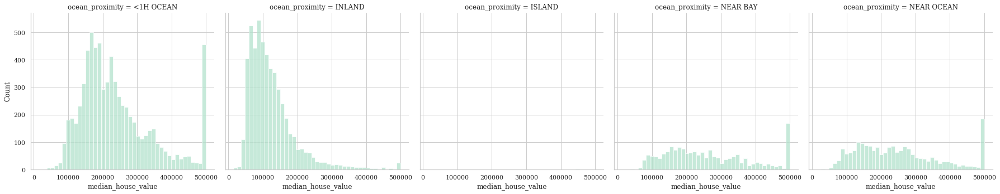

In [46]:
sns.displot(train_dataset, x="median_house_value", col="ocean_proximity")

* Die unterscheidliche Verteilung scheint die Vermutung zu Bestätigen. 


> Die Variable *ocean_proximity* sollte in dem statistischen  Modell (Klassifikation und Regression) mit berücksichtigt werden.

## Feature Engineering 

### Feature extraction 

Wie in der EDA festgestellt, besitzen die Variablen *total_rooms, total_bedrooms, population* und *households* eine hohe Korrelation untereinander und eine niedrige Korrelation zum *median_house_value*. Für das Modell wird versucht aus der Kombination der Variablen neue Merkmale zu generieren, welche eine höhere Korrelation zu der zu bestimmenden Größe aufweisen.  

In [47]:
train_dataset['households_population'] = train_dataset['households']/train_dataset['population']
train_dataset['total_rooms_households'] = train_dataset['total_rooms']/train_dataset['households']
train_dataset['total_rooms_total_bedrooms'] = train_dataset['total_rooms']/train_dataset['total_bedrooms']

In [48]:
corr = train_dataset.corr()
corr["median_house_value"].sort_values(ascending=False)

median_house_value            1.000000
median_income                 0.686126
total_rooms_total_bedrooms    0.381188
households_population         0.266170
total_rooms_households        0.138478
total_rooms                   0.131556
housing_median_age            0.107851
households                    0.064225
total_bedrooms                0.048469
population                   -0.028441
longitude                    -0.044385
latitude                     -0.146228
Name: median_house_value, dtype: float64

Die Variablen * households_population, total_rooms_households* und *total_rooms_total_bedrooms* wurden iterativ bestimmt. Grundlage für die Auswahl dieser Features ist die Korrelation zu *median_house_value*. Wie oben gezeigt weisen die konstruierten Features eine höhere Korrelation auf, als die ursprünglichen Variablen im Datensatz.

<AxesSubplot:xlabel='median_house_value', ylabel='total_rooms_total_bedrooms'>

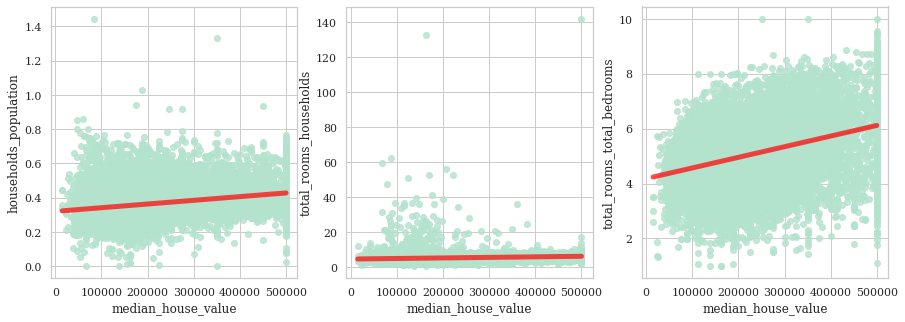

In [49]:
fig, axs = plt.subplots(1, 3, figsize=(15,5))
sns.regplot(x=train_dataset["median_house_value"], y=train_dataset["households_population"], line_kws={"color":"r","alpha":0.7,"lw":5}, ax=axs[0])
sns.regplot(x=train_dataset["median_house_value"], y=train_dataset["total_rooms_households"], line_kws={"color":"r","alpha":0.7,"lw":5}, ax=axs[1])
sns.regplot(x=train_dataset["median_house_value"], y=train_dataset["total_rooms_total_bedrooms"], line_kws={"color":"r","alpha":0.7,"lw":5}, ax=axs[2])

### Feature creation

Wie bei der Analyse der geographischen Daten festgestellt, kann es sinnvoll zu sein diese in dem statistischen Modell zu berücksichtigen. Es hat sich gezeigt, dass in bestimmten geographischen Bereichen verstärkt Distrikte mit hohem *median_house_value* liegen. Um Koordinatenangaben in Bereiche zu gliedern, können verschiedene Verfahren angewendet werden, z.B. Clustering. Ein anderer Ansatz ist die Verwendung von geohashes mit der Python-Bibliothek geohash. Im zu Grunde liegenden Konzept werden GPS-Daten in eine Kombination aus Buchstaben und Ziffern kodiert. Die Erde wird dabei in ein Schema aus Rechtecken unterteilt. Die Größe des Gitters wird über die Anzahl der Buchstaben bestimmt.[Quelle: [Wikpedia](https://en.wikipedia.org/wiki/Geohash)]

<img src="doc\geohash_grid.JPG" alt="drawing" width="400"/>

In [50]:
import geohash as gh
train_dataset_geo = train_dataset[['latitude', 'longitude']]
train_dataset['geohash']=train_dataset_geo.apply(lambda x: gh.encode(x.latitude, x.longitude, precision=3), axis=1)
train_dataset['geohash'] = train_dataset['geohash'].astype("category")

train_dataset

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,price_category,households_population,total_rooms_households,total_rooms_total_bedrooms,geohash
14740,-117.05,32.58,22.0,2101,399.0,1551,371,4.1518,136900.0,NEAR OCEAN,below,0.239201,5.663073,5.265664,9mu
10101,-117.97,33.92,32.0,2620,398.0,1296,429,5.7796,241300.0,<1H OCEAN,above,0.331019,6.107226,6.582915,9qh
20566,-121.84,38.65,29.0,3167,548.0,1554,534,4.3487,200700.0,INLAND,above,0.343629,5.930712,5.779197,9qc
2670,-115.60,33.20,37.0,709,187.0,390,142,2.4511,72500.0,INLAND,below,0.364103,4.992958,3.791444,9mv
15709,-122.43,37.79,25.0,1637,394.0,649,379,5.0049,460000.0,NEAR BAY,above,0.583975,4.319261,4.154822,9q8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7616,-118.22,33.86,16.0,8732,1489.0,3944,1493,5.1948,203500.0,<1H OCEAN,above,0.378550,5.848627,5.864338,9q5
8767,-118.39,33.81,35.0,1008,165.0,391,167,3.7778,487500.0,NEAR OCEAN,above,0.427110,6.035928,6.109091,9q5
16388,-121.30,38.05,52.0,122,26.0,62,25,1.1500,112500.0,INLAND,below,0.403226,4.880000,4.692308,9qc
19949,-119.37,36.21,35.0,2228,476.0,1567,449,1.4455,54100.0,INLAND,below,0.286535,4.962138,4.680672,9q7


In [51]:
train_dataset['geohash'].describe(include=['category'])

count     16351
unique       32
top         9q5
freq       3832
Name: geohash, dtype: object

Die Größe der Gitter ist auf drei Stellen des geohashs auslegt. Dies entspricht einem Gitter von einer Länge und Höhe von 156km. Das neue Feature "geohash" hat eine Ausprägung von 32 Werten. Mit einer 4stelligen Auflösung wäre es 493 Werte. Damit würde das Risiko für overfitting erhöht und die Anzahl der Spalten bei der Bildung von Dummy-Variabln aufgebläht werden. 
Da es sich um eine künstlich erzeugte kategoriale Variable handelt, besteht ebenfalls das Risiko, dass in den Testdaten Ausprägungen vorkommen mit welchen das Modell nicht trainiert wurde. 

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

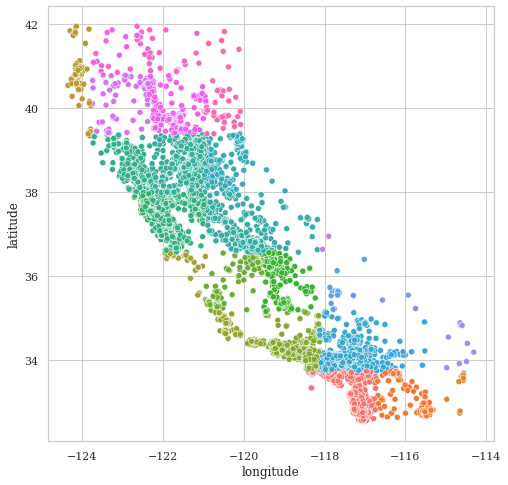

In [52]:
sns.scatterplot(data=train_dataset, x="longitude", y="latitude", hue="geohash", legend= False)


> Weiter Feature Selection findet modellspezifisch im nächsten Schritt statt. 